# Load manipulate and visualize spatial data

In [7]:
import geopandas as gpd
# import osmnx
import contextily as cx
import matplotlib.pyplot as plt

In [10]:
# cities = gpd.read_file("https://ndownloader.figshare.com/files/20232174")
city_gdf = gpd.read_file('data/sp_blg_adbscan_city_boundaries_v1.gpkg')

city_gdf

,city_id,n_buildings,geometry
0,ci000,2348,"POLYGON ((385390.071 4202949.446, 384488.697 4..."
1,ci001,2741,"POLYGON ((214893.033 4579137.558, 215258.185 4..."
2,ci002,5472,"POLYGON ((690674.281 4182188.538, 691047.526 4..."
3,ci003,14608,"POLYGON ((513378.282 4072327.639, 513408.853 4..."
4,ci004,2324,"POLYGON ((206989.081 4129478.031, 207275.702 4..."
...,...,...,...
712,ci858,1755,"POLYGON ((936758.235 4650353.917, 937046.524 4..."
713,ci860,2419,"POLYGON ((191152.366 4715533.725, 191009.949 4..."
714,ci869,2187,"POLYGON ((981306.101 4644778.993, 981468.164 4..."
715,ci880,1986,"POLYGON ((592194.932 4676275.761, 592766.349 4..."


In [17]:
# city_gdf.to_file('data/city/city.shp')
# city_gdf.to_file('data/city/city.geojson')
city_gdf.to_file('data/city/city.gpkg')

In [13]:
street_gdf = gpd.read_file('data/streets.geojson')

street_gdf

/Users/zefang/.local/share/virtualenvs/gis-q5Qx5MU5/lib/python3.13/site-packages/pyogrio/raw.py:198: RuntimeWarning: Several features with id = 4320053 have been found. Altering it to be unique. This warning will not be emitted anymore for this layer
  return ogr_read(


,name,id,wikipedia_link,gender,scale,category,typeofroad,geometry
0,Plaza Virgen de la Capilla,123483746,,Female,,-,-,"POLYGON ((-3.71472 40.4825, -3.7146 40.48229, ..."
1,Plaza Nuestra Señora del Prado,123483930,,Female,,-,-,"POLYGON ((-3.71404 40.48271, -3.71392 40.48249..."
2,Avenida del Cardenal Herrera Oria,4272448,,Male,,None,None,"LINESTRING (-3.71421 40.48307, -3.71407 40.483..."
3,Glorieta de Mariano Salvador Maella,4292687,,Male,,None,None,"LINESTRING (-3.7166 40.47909, -3.71665 40.4790..."
4,Calle de Pedro Rico,4292689,,Male,,None,None,"LINESTRING (-3.70463 40.48167, -3.70441 40.481..."
...,...,...,...,...,...,...,...,...
10375,Avenida del General Perón,801691271,,Male,,None,None,"LINESTRING (-3.69209 40.45199, -3.69233 40.45222)"
10376,Calle de Matilde Landa,801923267,https://es.wikipedia.org/wiki/Matilde_Landa,Female,,-,-,"LINESTRING (-3.6945 40.47325, -3.69455 40.47325)"
10377,Calle de Matilde Landa,801923268,https://es.wikipedia.org/wiki/Matilde_Landa,Female,,-,-,"LINESTRING (-3.69436 40.47324, -3.69447 40.473..."
10378,Calle de Matilde Landa,801923274,https://es.wikipedia.org/wiki/Matilde_Landa,Female,,-,-,"LINESTRING (-3.69515 40.47324, -3.69518 40.473..."


In [18]:
pois = osmnx.geometries_from_place(
    "Madrid, Spain", tags={"amenity": "bar"}
)

/var/folders/rc/qy8z9khd3lg00kj97hlgl5z00000gn/T/ipykernel_44855/1402187098.py:1: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  pois = osmnx.geometries_from_place(


In [19]:
# Inspecting spatial data

In [20]:
city_gdf.head()

,city_id,n_buildings,geometry
0,ci000,2348,"POLYGON ((385390.071 4202949.446, 384488.697 4..."
1,ci001,2741,"POLYGON ((214893.033 4579137.558, 215258.185 4..."
2,ci002,5472,"POLYGON ((690674.281 4182188.538, 691047.526 4..."
3,ci003,14608,"POLYGON ((513378.282 4072327.639, 513408.853 4..."
4,ci004,2324,"POLYGON ((206989.081 4129478.031, 207275.702 4..."


<Axes: >

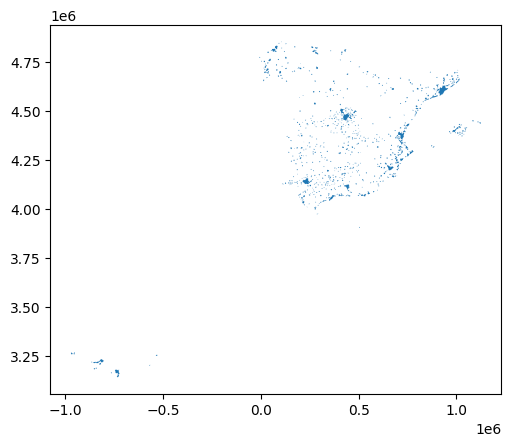

In [21]:
city_gdf.plot()

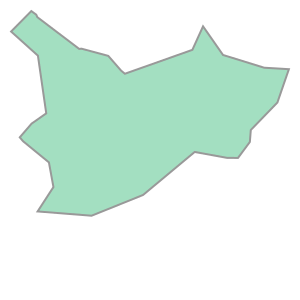

In [22]:
city_gdf.loc[0, 'geometry']

In [25]:
street_gdf.head()

,name,id,wikipedia_link,gender,scale,category,typeofroad,geometry
0,Plaza Virgen de la Capilla,123483746,,Female,,-,-,"POLYGON ((-3.71472 40.4825, -3.7146 40.48229, ..."
1,Plaza Nuestra Señora del Prado,123483930,,Female,,-,-,"POLYGON ((-3.71404 40.48271, -3.71392 40.48249..."
2,Avenida del Cardenal Herrera Oria,4272448,,Male,,None,None,"LINESTRING (-3.71421 40.48307, -3.71407 40.483..."
3,Glorieta de Mariano Salvador Maella,4292687,,Male,,None,None,"LINESTRING (-3.7166 40.47909, -3.71665 40.4790..."
4,Calle de Pedro Rico,4292689,,Male,,None,None,"LINESTRING (-3.70463 40.48167, -3.70441 40.481..."


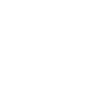

In [29]:
street_gdf.loc[2, 'geometry']

<Axes: >

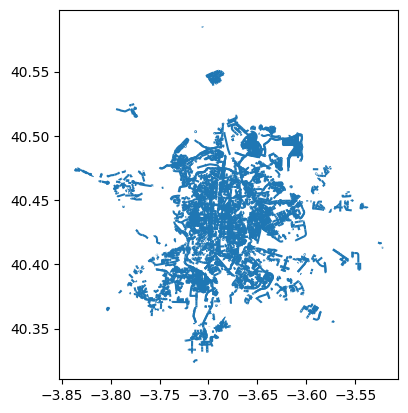

In [30]:
street_gdf.plot()

<Axes: >

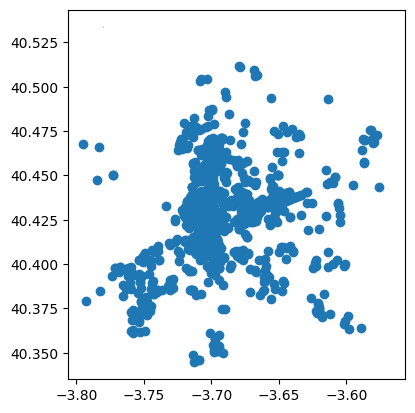

In [31]:
pois.plot()

<Axes: >

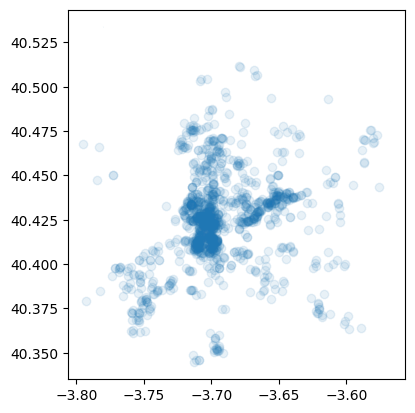

In [32]:
pois.plot(alpha=0.1)

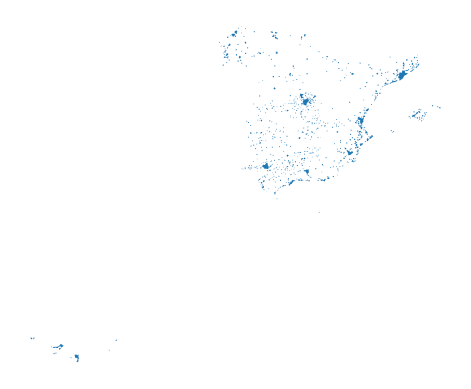

In [36]:
# Setup figure and axis
f, ax = plt.subplots(1)
# Plot layer of polygons on the axis
city_gdf.plot(ax=ax)
# Remove axis frames
ax.set_axis_off()
# Display
plt.show()

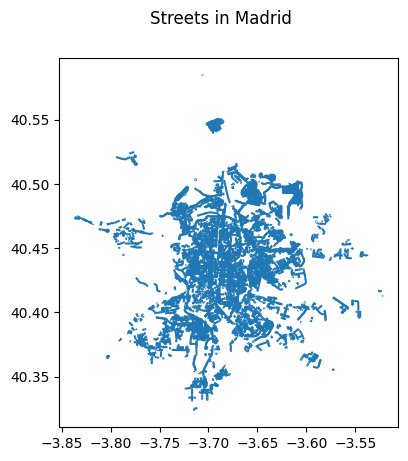

In [35]:
# Setup figure and axis
f, ax = plt.subplots(1)
# Add layer of polygons on the axis
street_gdf.plot(ax=ax)
# Add figure title
f.suptitle("Streets in Madrid")
# Display
plt.show()

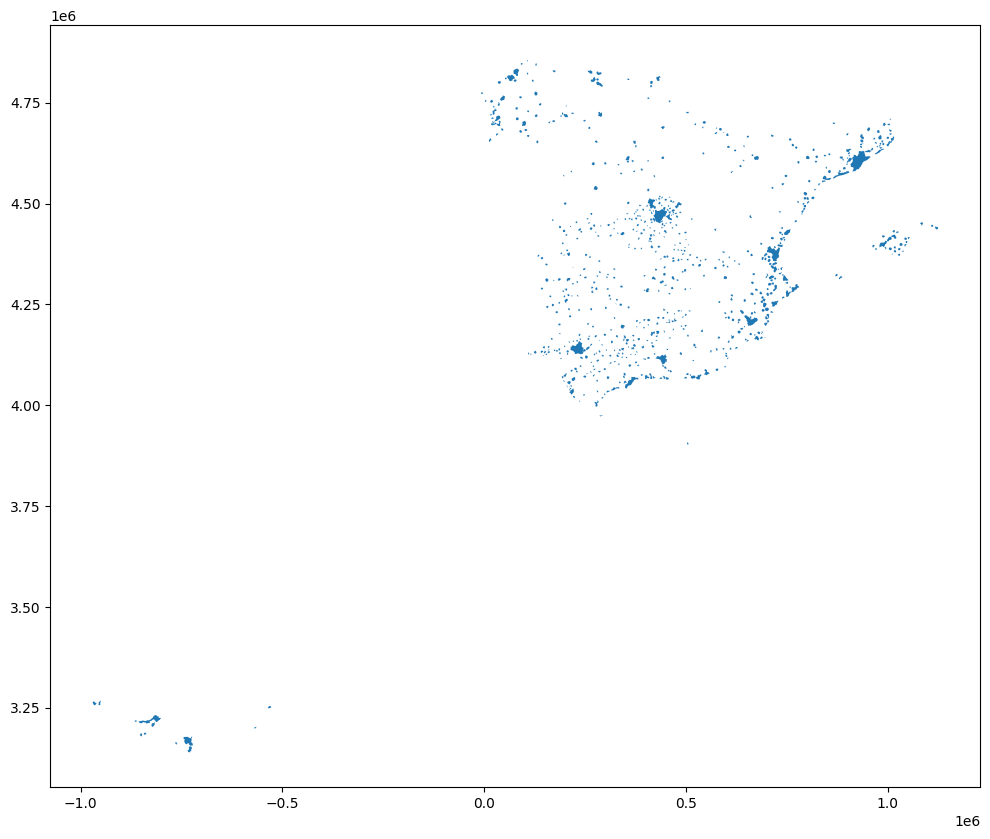

In [37]:
# Setup figure and axis with different size
f, ax = plt.subplots(1, figsize=(12, 12))
# Add layer of polygons on the axis
city_gdf.plot(ax=ax)
# Display
plt.show()

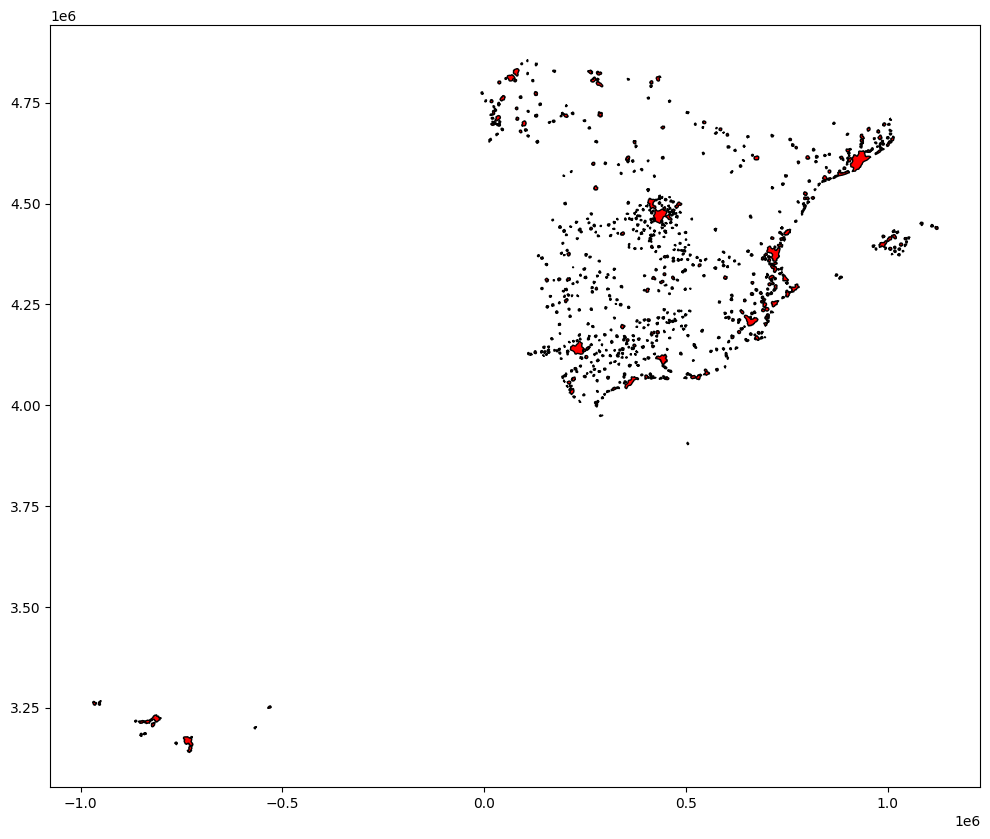

In [38]:
# Setup figure and axis
f, ax = plt.subplots(1, figsize=(12, 12))
# Add layer of polygons on the axis, set fill color (`facecolor`) and boundary
# color (`edgecolor`)
city_gdf.plot(
    linewidth=1, 
    facecolor='red',  # fill color
    edgecolor='black',  # border color
    ax=ax
);

<Axes: >

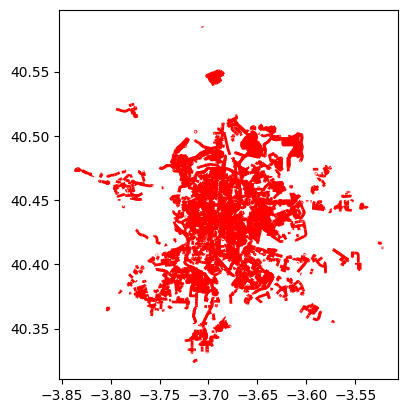

In [39]:
# Setup figure and axis
f, ax = plt.subplots(1)
# Add layer with lines, set them red and with different line width
# and append it to the axis `ax`
street_gdf.plot(linewidth=2, color='red', ax=ax)

In [40]:
city_gdf.crs

<Projected CRS: EPSG:25830>
Name: ETRS89 / UTM zone 30N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe between 6°W and 0°W: Faroe Islands offshore; Ireland - offshore; Jan Mayen - offshore; Norway including Svalbard - offshore; Spain - onshore and offshore.
- bounds: (-6.0, 35.26, 0.01, 80.49)
Coordinate Operation:
- name: UTM zone 30N
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989 ensemble
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

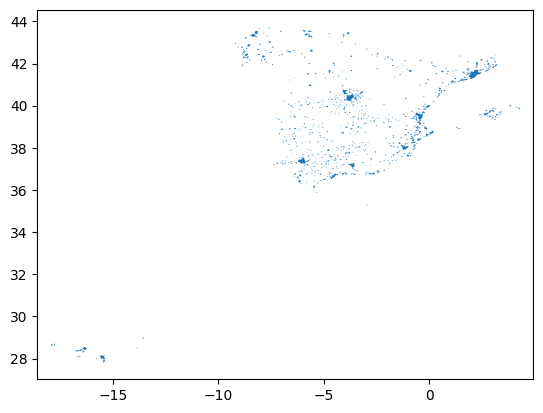

In [42]:
city_gdf.to_crs(epsg=4326).plot() 
lims = plt.axis('equal')

# Multi-layer maps

In [47]:
mad = city_gdf.loc[[12], :].to_crs(epsg=4326)
mad

,city_id,n_buildings,geometry
12,ci012,193714,"POLYGON ((-3.90016 40.30421, -3.90019 40.30457..."


<Axes: >

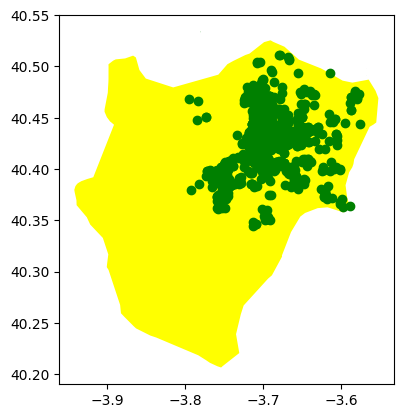

In [48]:
# Setup figure and axis
f, ax = plt.subplots(1)
# Add a layer with polygon on to axis `ax`
mad.plot(ax=ax, color="yellow")
# Add a layer with lines on top in axis `ax`
pois.plot(ax=ax, color="green")

# Manipulating spatial tables

In [51]:
city_areas = city_gdf.area
city_areas

0      8.449666e+06
1      9.121270e+06
2      1.322653e+07
3      6.808121e+07
4      1.072284e+07
           ...     
712    5.590236e+06
713    1.027875e+07
714    9.482455e+06
715    3.369692e+06
716    6.399249e+06
Length: 717, dtype: float64

In [54]:
street_length = street_gdf.to_crs(epsg=25830).length

street_length

0        120.776840
1        120.902920
2        396.494357
3        152.442895
4        101.392357
            ...    
10375     33.099726
10376      4.361490
10377     12.403794
10378      6.307745
10379      3.459535
Length: 10380, dtype: float64

In [55]:
# centroid
cents = cities.centroid
cents.head()

0    POINT (386147.759 4204605.994)
1    POINT (216296.159 4579397.331)
2    POINT (688901.588 4180201.774)
3    POINT (518262.028 4069898.674)
4    POINT (206940.936 4127361.966)
dtype: geometry

<Axes: >

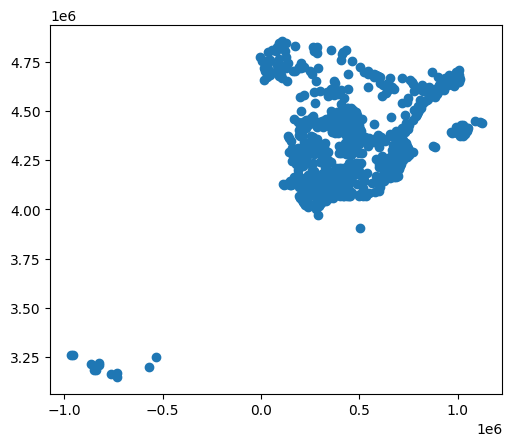

In [56]:
cents.plot()

In [59]:
# point in polygon
poly = cities.loc[12, "geometry"]
pt1 = cents[0]
pt2 = cents[12]

In [58]:
poly.contains(pt1)

False

In [60]:
poly.contains(pt2)

True

In [61]:
# buffers
pois_projected = pois.to_crs(city_gdf.crs)
pois_projected.crs

<Projected CRS: EPSG:25830>
Name: ETRS89 / UTM zone 30N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe between 6°W and 0°W: Faroe Islands offshore; Ireland - offshore; Jan Mayen - offshore; Norway including Svalbard - offshore; Spain - onshore and offshore.
- bounds: (-6.0, 35.26, 0.01, 80.49)
Coordinate Operation:
- name: UTM zone 30N
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989 ensemble
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [62]:
pois.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [63]:
buf = pois_projected.buffer(500)
buf.head()

element_type  osmid    
node          26808561     POLYGON ((440085.4 4475245.186, 440082.992 447...
              43274445     POLYGON ((441199.443 4482099.37, 441197.035 44...
              47216276     POLYGON ((440012.154 4473848.877, 440009.747 4...
              167301964    POLYGON ((441283.067 4473680.493, 441280.659 4...
              167302111    POLYGON ((441434.968 4473768.877, 441432.56 44...
dtype: geometry

<Axes: >

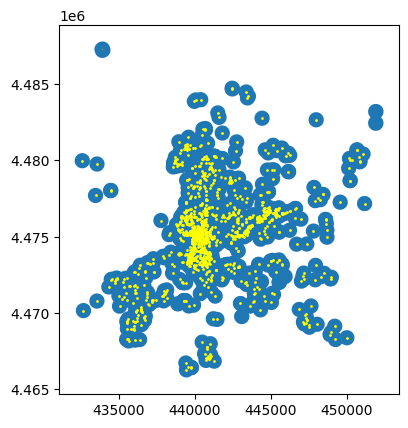

In [64]:
f, ax = plt.subplots(1)
# Plot buffer
buf.plot(ax=ax, linewidth=0)
# Plot named places on top for reference
# [NOTE how we modify the dot size (`markersize`)
# and the color (`color`)]
pois_projected.plot(ax=ax, markersize=1, color='yellow')

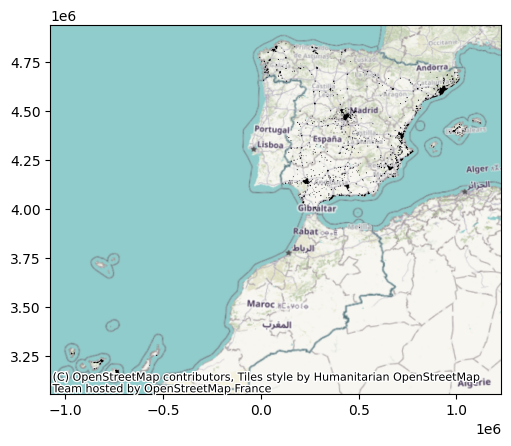

In [66]:
# adding base layer

ax = city_gdf.plot(color='black')
cx.add_basemap(ax, crs=city_gdf.crs)  # need to state the crs

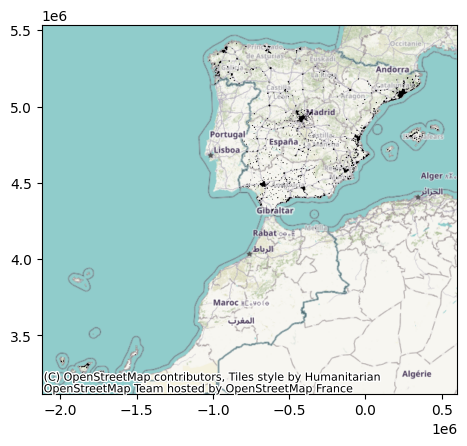

In [67]:
cities_wm = city_gdf.to_crs(epsg=3857)  # Pseudo-Mercator
ax = cities_wm.plot(color="black")
cx.add_basemap(ax);

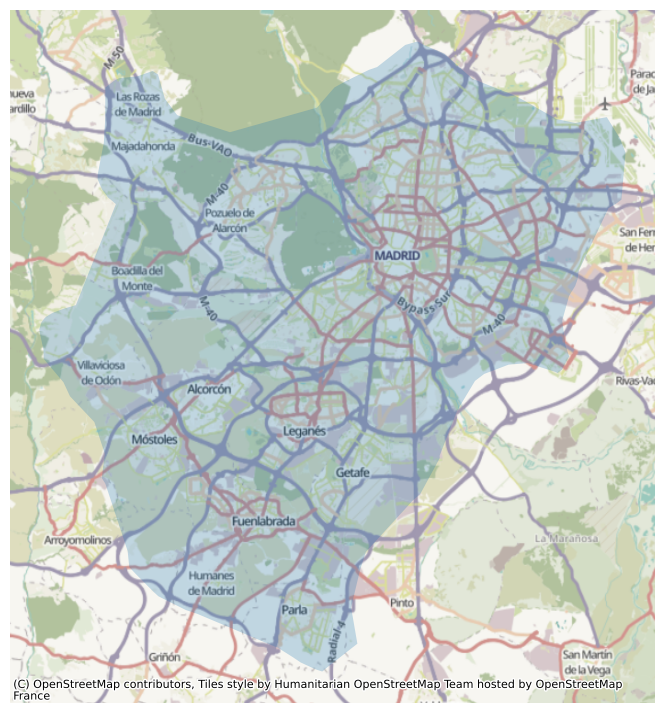

In [68]:
f, ax = plt.subplots(1, figsize=(9, 9))
mad.plot(alpha=0.25, ax=ax)
cx.add_basemap(ax, crs=mad.crs)
ax.set_axis_off()

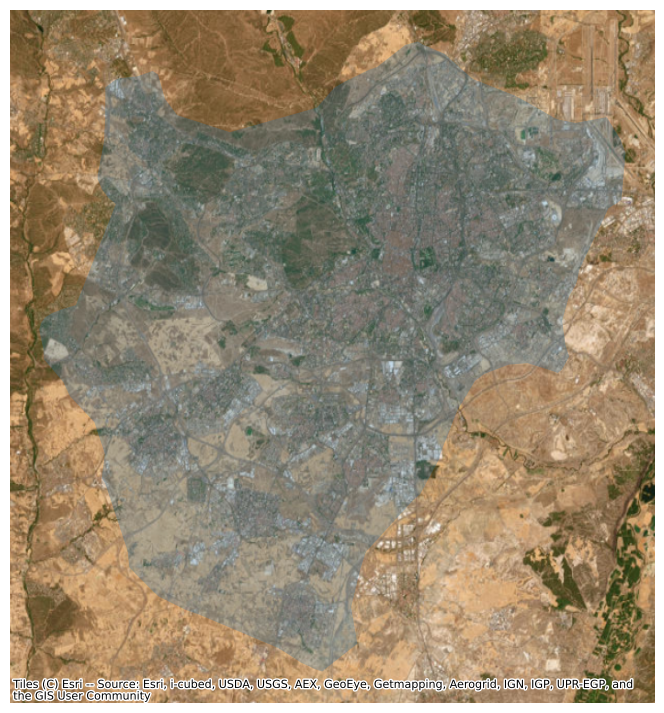

In [69]:
# use statelite images
f, ax = plt.subplots(1, figsize=(9, 9))
mad.plot(alpha=0.25, ax=ax)
cx.add_basemap(
    ax, 
    crs=mad.crs,
    source=cx.providers.Esri.WorldImagery  # satellite image
)
ax.set_axis_off()

In [71]:
# interactive maps
# leaflet.js, mapbox

street_gdf.explore()
